In [1]:
#한글 처리해주는 라이브러리

import konlpy

In [2]:
!pip install xmltodict

In [3]:
!pip install BeautifulSoup4

#### xml 파일로 워드클라우드 만들기

In [1]:
url = 'http://apis.data.go.kr/1170000/law/lawSearchList.do?\
serviceKey=22Nn4Pf%2BappHSmLc8TsnR7KrSDh2oLZY%2BKUO%2Fk%2BAzsebJsWWxNqAafz3Y4c1t7SVy6SUTa2qvXNdbIwBzIvhrQ%3D%3D&\
target=law&query=*&numOfRows=10000&pageNo=1'

In [2]:
import requests
from bs4 import BeautifulSoup as bs
import xmltodict

In [3]:
#url의 내용 긁어오기

req=requests.get(url).content
req

b'<?xml version="1.0" encoding="UTF-8"?><LawSearch><target>law</target><\xed\x82\xa4\xec\x9b\x8c\xeb\x93\x9c>*</\xed\x82\xa4\xec\x9b\x8c\xeb\x93\x9c><section>lawNm</section><totalCnt>5219</totalCnt><page>1</page><numOfRows>5219</numOfRows><resultCode>00</resultCode><resultMsg>success</resultMsg><law id="1"><\xeb\xb2\x95\xeb\xa0\xb9\xec\x9d\xbc\xeb\xa0\xa8\xeb\xb2\x88\xed\x98\xb8>232157</\xeb\xb2\x95\xeb\xa0\xb9\xec\x9d\xbc\xeb\xa0\xa8\xeb\xb2\x88\xed\x98\xb8><\xed\x98\x84\xed\x96\x89\xec\x97\xb0\xed\x98\x81\xec\xbd\x94\xeb\x93\x9c>\xed\x98\x84\xed\x96\x89</\xed\x98\x84\xed\x96\x89\xec\x97\xb0\xed\x98\x81\xec\xbd\x94\xeb\x93\x9c><\xeb\xb2\x95\xeb\xa0\xb9\xeb\xaa\x85\xed\x95\x9c\xea\xb8\x80><![CDATA[10\xe3\x86\x8d27\xeb\xb2\x95\xeb\x82\x9c \xed\x94\xbc\xed\x95\xb4\xec\x9e\x90\xec\x9d\x98 \xeb\xaa\x85\xec\x98\x88\xed\x9a\x8c\xeb\xb3\xb5 \xeb\x93\xb1\xec\x97\x90 \xea\xb4\x80\xed\x95\x9c \xeb\xb2\x95\xeb\xa5\xa0]]></\xeb\xb2\x95\xeb\xa0\xb9\xeb\xaa\x85\xed\x95\x9c\xea\xb8\x80><\xeb\xb2\x95\

In [4]:
#xml파일을 딕셔너리형식으로 변환

xmlobject=xmltodict.parse(req)
xmlobject

{'LawSearch': {'target': 'law',
  '키워드': '*',
  'section': 'lawNm',
  'totalCnt': '5219',
  'page': '1',
  'numOfRows': '5219',
  'resultCode': '00',
  'resultMsg': 'success',
  'law': [{'@id': '1',
    '법령일련번호': '232157',
    '현행연혁코드': '현행',
    '법령명한글': '10ㆍ27법난 피해자의 명예회복 등에 관한 법률',
    '법령약칭명': '10ㆍ27법난법',
    '법령ID': '010719',
    '공포일자': '20210518',
    '공포번호': '18146',
    '제개정구분명': '일부개정',
    '소관부처코드': '1371000',
    '소관부처명': '문화체육관광부',
    '법령구분명': '법률',
    '시행일자': '20210518',
    '자법타법여부': None,
    '법령상세링크': '/DRF/lawService.do?OC=sapphire_5&target=law&MST=232157&type=HTML&mobileYn=&efYd=20210518'},
   {'@id': '2',
    '법령일련번호': '235703',
    '현행연혁코드': '현행',
    '법령명한글': '10ㆍ27법난 피해자의 명예회복 등에 관한 법률 시행령',
    '법령약칭명': '10ㆍ27법난법시행령',
    '법령ID': '010831',
    '공포일자': '20210929',
    '공포번호': '32018',
    '제개정구분명': '타법개정',
    '소관부처코드': '1371000',
    '소관부처명': '문화체육관광부',
    '법령구분명': '대통령령',
    '시행일자': '20210929',
    '자법타법여부': None,
    '법령상세링크': '/DRF/lawService.do?OC=sapphi

In [5]:
#변환된 딕셔너리형식을 데이터프레임화

import pandas as pd
import numpy as np

df=pd.DataFrame(xmlobject['LawSearch']['law'])
df.head()

,@id,법령일련번호,현행연혁코드,법령명한글,법령약칭명,법령ID,공포일자,공포번호,제개정구분명,소관부처코드,소관부처명,법령구분명,시행일자,자법타법여부,법령상세링크
0,1,232157,현행,10ㆍ27법난 피해자의 명예회복 등에 관한 법률,10ㆍ27법난법,010719,20210518,18146,일부개정,1371000,문화체육관광부,법률,20210518,None,/DRF/lawService.do?OC=sapphire_5&target=law&MS...
1,2,235703,현행,10ㆍ27법난 피해자의 명예회복 등에 관한 법률 시행령,10ㆍ27법난법시행령,010831,20210929,32018,타법개정,1371000,문화체육관광부,대통령령,20210929,None,/DRF/lawService.do?OC=sapphire_5&target=law&MS...
2,3,236231,현행,119구조ㆍ구급에 관한 법률,119법,011349,20211019,18487,일부개정,1661000,소방청,법률,20220120,None,/DRF/lawService.do?OC=sapphire_5&target=law&MS...
3,4,236155,현행,119구조ㆍ구급에 관한 법률 시행령,119법시행령,011452,20211019,32070,일부개정,1661000,소방청,대통령령,20220106,None,/DRF/lawService.do?OC=sapphire_5&target=law&MS...
4,5,243963,현행,119구조ㆍ구급에 관한 법률 시행규칙,119법시행규칙,011457,20220721,00345,일부개정,1661000,소방청,행정안전부령,20220721,None,/DRF/lawService.do?OC=sapphire_5&target=law&MS...


In [6]:
#법령명한글 변수의 배열화->리스트화

target=df['법령명한글'].values
title_list=target.tolist()
title_list

['10ㆍ27법난 피해자의 명예회복 등에 관한 법률',
 '10ㆍ27법난 피해자의 명예회복 등에 관한 법률 시행령',
 '119구조ㆍ구급에 관한 법률',
 '119구조ㆍ구급에 관한 법률 시행령',
 '119구조ㆍ구급에 관한 법률 시행규칙',
 '1945년이후종전의규정에의한학교졸업자자격인정령',
 '1959년 12월 31일 이전에 퇴직한 군인의 퇴직급여금지급에 관한 특별법',
 '1959년 12월 31일 이전에 퇴직한 군인의 퇴직급여금지급에 관한 특별법 시행령',
 '1980년해직공무원의보상등에관한특별조치법',
 '1980년해직공무원의보상등에관한특별조치법시행령',
 '1인 창조기업 육성에 관한 법률',
 '1인 창조기업 육성에 관한 법률 시행령',
 '2018 평창 동계올림픽대회 및 동계패럴림픽대회 지원 등에 관한 특별법',
 '2018 평창 동계올림픽대회 및 동계패럴림픽대회 지원 등에 관한 특별법 시행령',
 '2023 새만금 세계스카우트잼버리 지원 특별법',
 '2023 새만금 세계스카우트잼버리 지원 특별법 시행령',
 '2023 순천만국제정원박람회 지원 및 사후활용에 관한 특별법',
 '2023 순천만국제정원박람회 지원 및 사후활용에 관한 특별법 시행령',
 '2030 부산세계박람회 유치위원회의 설치 및 운영에 관한 규정',
 '30개월 이상 복무한 상등병 만기전역자의 특별진급을 위한 특별법',
 '30개월 이상 복무한 상등병 만기전역자의 특별진급을 위한 특별법 시행령',
 '3ㆍ15의거 참여자의 명예회복 등에 관한 법률',
 '3ㆍ15의거 참여자의 명예회복 등에 관한 법률 시행령',
 '4ㆍ16세월호참사 진상규명 및 안전사회 건설 등을 위한 특별법',
 '4ㆍ16세월호참사 진상규명 및 안전사회 건설 등을 위한 특별법 시행령',
 '4ㆍ16세월호참사 피해구제 및 지원 등을 위한 특별법',
 '4ㆍ16세월호참사 피해구제 및 지원 등을 위한 특별법 시행령',
 '4차산업혁명위원회의 설치 및 운영에 관한 규정',
 '5ㆍ18민주유공자예우 및 단체설립에 관한 법률

In [7]:
#전체 요소들을 텍스트로 묶기

text=' '.join(title_list)
text[:100]

'10ㆍ27법난 피해자의 명예회복 등에 관한 법률 10ㆍ27법난 피해자의 명예회복 등에 관한 법률 시행령 119구조ㆍ구급에 관한 법률 119구조ㆍ구급에 관한 법률 시행령 119구조ㆍ'

In [8]:
#품사 뽑기

from konlpy.tag import Okt

okt=Okt()
morph=okt.pos(text)         #pos 메서드는 단어와 품사를 같이 추출해줌
morph

[('10', 'Number'),
 ('ㆍ', 'Foreign'),
 ('27', 'Number'),
 ('법난', 'Noun'),
 ('피해자', 'Noun'),
 ('의', 'Josa'),
 ('명예', 'Noun'),
 ('회복', 'Noun'),
 ('등', 'Noun'),
 ('에', 'Josa'),
 ('관', 'Noun'),
 ('한', 'Josa'),
 ('법률', 'Noun'),
 ('10', 'Number'),
 ('ㆍ', 'Foreign'),
 ('27', 'Number'),
 ('법난', 'Noun'),
 ('피해자', 'Noun'),
 ('의', 'Josa'),
 ('명예', 'Noun'),
 ('회복', 'Noun'),
 ('등', 'Noun'),
 ('에', 'Josa'),
 ('관', 'Noun'),
 ('한', 'Josa'),
 ('법률', 'Noun'),
 ('시행', 'Noun'),
 ('령', 'Noun'),
 ('119', 'Number'),
 ('구조', 'Noun'),
 ('ㆍ', 'Foreign'),
 ('구급', 'Noun'),
 ('에', 'Josa'),
 ('관', 'Noun'),
 ('한', 'Josa'),
 ('법률', 'Noun'),
 ('119', 'Number'),
 ('구조', 'Noun'),
 ('ㆍ', 'Foreign'),
 ('구급', 'Noun'),
 ('에', 'Josa'),
 ('관', 'Noun'),
 ('한', 'Josa'),
 ('법률', 'Noun'),
 ('시행', 'Noun'),
 ('령', 'Noun'),
 ('119', 'Number'),
 ('구조', 'Noun'),
 ('ㆍ', 'Foreign'),
 ('구급', 'Noun'),
 ('에', 'Josa'),
 ('관', 'Noun'),
 ('한', 'Josa'),
 ('법률', 'Noun'),
 ('시행', 'Noun'),
 ('규칙', 'Noun'),
 ('1945년', 'Number'),
 ('이후종전의규정에의한학교졸업자

In [9]:
# 조사를 뺸 다른 품사 및 단어 추출

noun_list=[]
for word,tag in morph:
    if(tag=='Noun') & (len(word)>1):
        noun_list.append(word)

print(noun_list)

['법난', '피해자', '명예', '회복', '법률', '법난', '피해자', '명예', '회복', '법률', '시행', '구조', '구급', '법률', '구조', '구급', '법률', '시행', '구조', '구급', '법률', '시행', '규칙', '이전', '퇴직', '군인', '퇴직', '금지', '특별법', '이전', '퇴직', '군인', '퇴직', '금지', '특별법', '시행', '창조', '기업', '육성', '법률', '창조', '기업', '육성', '법률', '시행', '평창', '동계올림픽', '대회', '동계', '패럴림픽', '대회', '지원', '특별법', '평창', '동계올림픽', '대회', '동계', '패럴림픽', '대회', '지원', '특별법', '시행', '새만금', '세계', '스카우트', '잼버리', '지원', '특별법', '새만금', '세계', '스카우트', '잼버리', '지원', '특별법', '시행', '순천만', '국제', '정원', '박람회', '지원', '사후', '활용', '특별법', '순천만', '국제', '정원', '박람회', '지원', '사후', '활용', '특별법', '시행', '부산', '세계박람회', '유치', '위원회', '설치', '운영', '규정', '개월', '이상', '복무', '상등병', '전역', '특별', '진급', '특별법', '개월', '이상', '복무', '상등병', '전역', '특별', '진급', '특별법', '시행', '의거', '참여자', '명예', '회복', '법률', '의거', '참여자', '명예', '회복', '법률', '시행', '세월호', '참사', '진상', '규명', '안전', '사회', '건설', '특별법', '세월호', '참사', '진상', '규명', '안전', '사회', '건설', '특별법', '시행', '세월호', '참사', '피해', '구제', '지원', '특별법', '세월호', '참사', '피해', '구제', '지원', '특별법', '시행', '산업혁명',

In [13]:
#조사 별 count 세기

from collections import Counter

one_word=[]
for word, tag in morph:
    if (tag=='Noun') & (len(word)==1):
        one_word.append(word)

one_dict=dict(Counter(one_word).most_common())     #개수가 많은 순으로 정렬 후 딕셔너리화
one_dict

{'관': 2394,
 '령': 1494,
 '법': 1448,
 '및': 1257,
 '등': 740,
 '위': 146,
 '그': 100,
 '군': 37,
 '제': 37,
 '업': 36,
 '물': 33,
 '예': 21,
 '처': 17,
 '금': 16,
 '친': 15,
 '회': 15,
 '용': 15,
 '특': 14,
 '급': 13,
 '재': 13,
 '정': 13,
 '도': 13,
 '적': 12,
 '비': 12,
 '항': 11,
 '산': 11,
 '댐': 11,
 '증': 10,
 '류': 10,
 '시': 10,
 '중': 9,
 '형': 9,
 '융': 9,
 '차': 8,
 '농': 8,
 '인': 7,
 '단': 7,
 '초': 7,
 '선': 7,
 '직': 6,
 '청': 6,
 '징': 6,
 '체': 6,
 '삶': 6,
 '질': 6,
 '역': 6,
 '쌀': 6,
 '수': 5,
 '임': 5,
 '계': 5,
 '부': 5,
 '말': 4,
 '품': 4,
 '국': 4,
 '기': 4,
 '활': 4,
 '자': 4,
 '내': 3,
 '폐': 3,
 '유': 3,
 '생': 3,
 '칙': 3,
 '날': 3,
 '설': 3,
 '김': 3,
 '일': 3,
 '리': 3,
 '트': 3,
 '륙': 3,
 '감': 3,
 '민': 3,
 '밀': 3,
 '소': 3,
 '건': 3,
 '집': 3,
 '료': 3,
 '송': 3,
 '봄': 3,
 '권': 3,
 '능': 3,
 '입': 3,
 '범': 3,
 '망': 3,
 '교': 3,
 '목': 3,
 '안': 3,
 '층': 3,
 '후': 3,
 '밖': 3,
 '옥': 3,
 '접': 2,
 '별': 2,
 '사': 2,
 '광': 2,
 '포': 2,
 '고': 2,
 '뇌': 2,
 '바': 2,
 '테': 2,
 '탈': 2,
 '호': 2,
 '보': 2,
 '섬': 2,
 '엽': 2,
 '투': 2,
 '세': 2,
 '격':

In [11]:
keys=sorted(one_dict.items(), key=lambda x: x[1], reverse=True)
keys

[('관', 2394),
 ('령', 1494),
 ('법', 1448),
 ('및', 1257),
 ('등', 740),
 ('위', 146),
 ('그', 100),
 ('군', 37),
 ('제', 37),
 ('업', 36),
 ('물', 33),
 ('예', 21),
 ('처', 17),
 ('금', 16),
 ('친', 15),
 ('회', 15),
 ('용', 15),
 ('특', 14),
 ('급', 13),
 ('재', 13),
 ('정', 13),
 ('도', 13),
 ('적', 12),
 ('비', 12),
 ('항', 11),
 ('산', 11),
 ('댐', 11),
 ('증', 10),
 ('류', 10),
 ('시', 10),
 ('중', 9),
 ('형', 9),
 ('융', 9),
 ('차', 8),
 ('농', 8),
 ('인', 7),
 ('단', 7),
 ('초', 7),
 ('선', 7),
 ('직', 6),
 ('청', 6),
 ('징', 6),
 ('체', 6),
 ('삶', 6),
 ('질', 6),
 ('역', 6),
 ('쌀', 6),
 ('수', 5),
 ('임', 5),
 ('계', 5),
 ('부', 5),
 ('말', 4),
 ('품', 4),
 ('국', 4),
 ('기', 4),
 ('활', 4),
 ('자', 4),
 ('내', 3),
 ('폐', 3),
 ('유', 3),
 ('생', 3),
 ('칙', 3),
 ('날', 3),
 ('설', 3),
 ('김', 3),
 ('일', 3),
 ('리', 3),
 ('트', 3),
 ('륙', 3),
 ('감', 3),
 ('민', 3),
 ('밀', 3),
 ('소', 3),
 ('건', 3),
 ('집', 3),
 ('료', 3),
 ('송', 3),
 ('봄', 3),
 ('권', 3),
 ('능', 3),
 ('입', 3),
 ('범', 3),
 ('망', 3),
 ('교', 3),
 ('목', 3),
 ('안', 3),
 ('층', 3),
 (

In [14]:
#시각화

from collections import Counter
from matplotlib import rc
import matplotlib.pyplot as plt
import seaborn as sns

rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus']=False     # 마이너스 부호 깨짐 방지

count=Counter(noun_list)
data=dict(count.most_common())
series=pd.Series(data)
df=pd.DataFrame(series, columns=['cnt'])
df_sort=df.sort_values(by='cnt', ascending=False)
df_sort=df_sort.reset_index()


{'시행': 2442,
 '규칙': 1753,
 '법률': 1481,
 '관리': 535,
 '지원': 364,
 '규정': 324,
 '특별법': 317,
 '진흥': 284,
 '산업': 276,
 '운영': 247,
 '안전': 181,
 '공무원': 170,
 '기본': 165,
 '보호': 148,
 '위원회': 139,
 '촉진': 137,
 '설치': 127,
 '설립': 127,
 '한국': 124,
 '사업': 122,
 '육성': 121,
 '직제': 120,
 '이용': 117,
 '기관': 113,
 '소속': 109,
 '지역': 103,
 '사법': 95,
 '개발': 94,
 '교육': 87,
 '발전': 86,
 '국가': 85,
 '기술': 84,
 '시설': 78,
 '특례법': 76,
 '촉진법': 75,
 '환경': 73,
 '문화': 70,
 '조성': 68,
 '대한': 66,
 '의료': 65,
 '특별': 64,
 '활성화': 61,
 '방지': 59,
 '보상': 58,
 '사무': 58,
 '지방': 58,
 '국제': 57,
 '등록': 57,
 '해양': 57,
 '보건': 56,
 '학교': 56,
 '자원': 54,
 '법인': 53,
 '처리': 51,
 '정보': 51,
 '보험': 51,
 '건설': 50,
 '경찰': 49,
 '도시': 49,
 '조치': 48,
 '기준': 48,
 '성법': 48,
 '피해': 47,
 '개선': 47,
 '소관': 47,
 '복지': 47,
 '국립': 47,
 '회의': 46,
 '예방': 46,
 '관세': 46,
 '선박': 46,
 '활용': 44,
 '감독': 43,
 '법원': 42,
 '조사': 42,
 '사회': 41,
 '활동': 41,
 '임용': 41,
 '헌법재판소': 41,
 '식품': 40,
 '기금': 40,
 '금융': 40,
 '선거': 39,
 '지정': 39,
 '거래': 38,
 '처벌': 38,
 '농어': 38,
 '등기'

<AxesSubplot:xlabel='index', ylabel='cnt'>

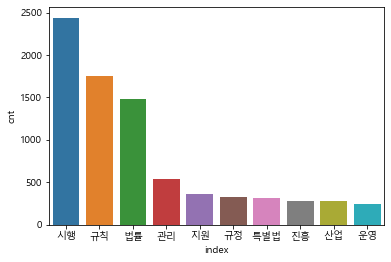

In [16]:
df_10=df_sort[:10]

sns.barplot(x='index',y='cnt', data=df_10, orient='v')

In [17]:
!pip install wordcloud

(-0.5, 1999.5, 1499.5, -0.5)

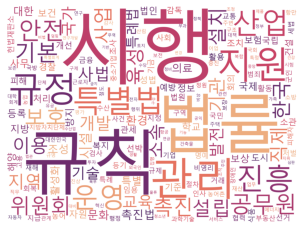

In [18]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

wordcloud=WordCloud(font_path='../visualization/dataset/malgun.ttf',
                                           background_color='white',
                                            colormap="flare",
                                            width=2000,
                                            height=1500).generate_from_frequencies(data)

plt.imshow(wordcloud)
plt.axis('off')


## 과제 07/22_1

#### 관심있는 카테고리 text 데이터를 웹에서 가져와서 시각화하세요(bar, wordcloud 등등)

In [19]:
#원숭이두창 기사 3개에 대한 워드클라우드 만들기

import requests
from bs4 import BeautifulSoup
import urllib

url1='https://www.yna.co.kr/view/AKR20220724027751530?input=1195m'
url2='https://news.kmib.co.kr/article/view.asp?arcid=0017304957&code=61131111&cp=nv'
url3='https://www.yna.co.kr/view/AKR20220724008300009?input=1195m'

In [21]:
#첫번째 기사
response1=requests.get(url1).content
response1=response1.decode('utf-8')
soup1=BeautifulSoup(response1,'html.parser')
soup1

<!DOCTYPE html>

<html class="ko" lang="ko">
<head itemscope="">
<meta charset="utf-8"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="width=device-width,initial-scale=1.0,maximum-scale=1.0,minimum-scale=1.0,user-scalable=no" name="viewport"/>
<meta content="max-image-preview:large, max-video-preview:0" name="robots"/>
<link href="https://www.yna.co.kr/view/AKR20220724027751530" id="canonical" rel="canonical"/>
<meta content="https://www.yna.co.kr/view/AKR20220724027751530" property="og:url">
<meta content="https://www.yna.co.kr/view/AKR20220724027751530" name="twitter:url">
<meta content="https://www.yna.co.kr/view/AKR20220724027751530" itemprop="url">
<link href="https://m.yna.co.kr/amp/view/AKR20220724027751530" rel="amphtml"/>
<meta content="1013291918759197" property="fb:app_id">
<meta content="130229496988833" property="fb:pages"/>
<meta content="article" property="og:type"/>
<meta content="article" name="resource-type"/>
<meta content="Yonhapnews" name="c

In [22]:
p1s=soup1.find_all('p')
p1s

[<p class="blind">재난포털</p>,
 <p class="blind">기사제보</p>,
 <p class="">자동완성 기능이 켜져 있습니다.</p>,
 <p class="update-time"><span class="txt">송고시간</span>2022-07-24 17:16</p>,
 <p class="txt-desc">(영종도=연합뉴스) 서대연 기자 = 세계보건기구(WHO)가 약 70개국에서 발병이 확인된 원숭이두창에 국제적 공중보건 비상사태(PHEIC)를 선언했다.<br/> 국제적 공중보건 비상사태는 WHO가 내릴 수 있는 최고 수준의 경계 단계로 에볼라, 코로나19에 이어 이번이 7번째 선언이다. 사진은 24일 인천국제공항 제1여객터미널에 감염 주의 안내문이 표시된 화면. 2022.7.24 dwise@yna.co.kr</p>,
 <p class="txt-link"><a href="" target="_blank" title="새창"></a></p>,
 <p> (서울=연합뉴스) 조민정 기자 = 세계보건기구(WHO)가 원숭이두창 감염사태에 대해 국제적 공중보건 비상사태(PHEIC)를 선언하면서 국내 원숭이두창 대응 방안에도 관심이 쏠린다.</p>,
 <p> 이미 한 달 전 국내에서 첫 확진자가 확인됐던 만큼 우리나라도 안전지대는 아니다.</p>,
 <p> 질병관리청은 24일 "국내외 발생상황과 WHO의 PHEIC 선포를 고려해 이번주 중에 위기상황 평가회의를 개최, 조치상황을 점검하기로 했다"고 밝혔다.</p>,
 <p> 정부는 일단 서둘러 새로운 대응책을 내놓기보다는 기존 대책을 재점검하고 상황을 면밀히 주시하는 데 집중하는 분위기다.</p>,
 <p> 이번 원숭이두창의 PHEIC 선언은 이 질병의 유행세나 치명률이 코로나19만큼 강하다는 의미보다는 선제 대응이 필요하다는 신호라는 게 방역 당국의 판단이다.</p>,
 <p> 전날 WHO가 PHEIC를 선언하기에 앞서 열린 긴급위원회에서는 15명 위원 가운데 9명이 이 결정에 부정적이었던 것으로

In [23]:
p1s=p1s[4:-3]

In [24]:
text1=''
for p1 in p1s:
    text1+=p1.text

print(text1)

(영종도=연합뉴스) 서대연 기자 = 세계보건기구(WHO)가 약 70개국에서 발병이 확인된 원숭이두창에 국제적 공중보건 비상사태(PHEIC)를 선언했다. 국제적 공중보건 비상사태는 WHO가 내릴 수 있는 최고 수준의 경계 단계로 에볼라, 코로나19에 이어 이번이 7번째 선언이다. 사진은 24일 인천국제공항 제1여객터미널에 감염 주의 안내문이 표시된 화면. 2022.7.24 dwise@yna.co.kr (서울=연합뉴스) 조민정 기자 = 세계보건기구(WHO)가 원숭이두창 감염사태에 대해 국제적 공중보건 비상사태(PHEIC)를 선언하면서 국내 원숭이두창 대응 방안에도 관심이 쏠린다. 이미 한 달 전 국내에서 첫 확진자가 확인됐던 만큼 우리나라도 안전지대는 아니다. 질병관리청은 24일 "국내외 발생상황과 WHO의 PHEIC 선포를 고려해 이번주 중에 위기상황 평가회의를 개최, 조치상황을 점검하기로 했다"고 밝혔다. 정부는 일단 서둘러 새로운 대응책을 내놓기보다는 기존 대책을 재점검하고 상황을 면밀히 주시하는 데 집중하는 분위기다. 이번 원숭이두창의 PHEIC 선언은 이 질병의 유행세나 치명률이 코로나19만큼 강하다는 의미보다는 선제 대응이 필요하다는 신호라는 게 방역 당국의 판단이다. 전날 WHO가 PHEIC를 선언하기에 앞서 열린 긴급위원회에서는 15명 위원 가운데 9명이 이 결정에 부정적이었던 것으로 알려졌다. 원숭이두창의 확산세나 치명률 등이 PHEIC 선언 요건을 갖췄는지에 대해서는 의견이 나뉘었다는 의미다. 여기에 환자 증가폭이 가파른 유럽 등과 달리 우리나라를 포함한 아시아 국가들은 다소 유행에서 비켜나 있는 상황인데다 국내에서는 첫 환자 확인과 함께 상당한 수준의 조치가 이미 시행 중인 상황이다. 질병청은 "원숭이두창은 유럽과 미주지역을 중심으로 많은 사례가 보고되고 있는 반면 중동을 제외한 아시아 국가는 가장 낮은 확진자 발생이 확인되고 있다"며 "WHO는 원숭이두창 위험도를 유럽은 '높음', 유럽을 제외한 세계는 '중간'으로 1차 비상위원회 때와 동일하

In [25]:
import re

text1=re.sub('[a-z@.]','',text1)
text1

'(영종도=연합뉴스) 서대연 기자 = 세계보건기구(WHO)가 약 70개국에서 발병이 확인된 원숭이두창에 국제적 공중보건 비상사태(PHEIC)를 선언했다 국제적 공중보건 비상사태는 WHO가 내릴 수 있는 최고 수준의 경계 단계로 에볼라, 코로나19에 이어 이번이 7번째 선언이다 사진은 24일 인천국제공항 제1여객터미널에 감염 주의 안내문이 표시된 화면 2022724  (서울=연합뉴스) 조민정 기자 = 세계보건기구(WHO)가 원숭이두창 감염사태에 대해 국제적 공중보건 비상사태(PHEIC)를 선언하면서 국내 원숭이두창 대응 방안에도 관심이 쏠린다 이미 한 달 전 국내에서 첫 확진자가 확인됐던 만큼 우리나라도 안전지대는 아니다 질병관리청은 24일 "국내외 발생상황과 WHO의 PHEIC 선포를 고려해 이번주 중에 위기상황 평가회의를 개최, 조치상황을 점검하기로 했다"고 밝혔다 정부는 일단 서둘러 새로운 대응책을 내놓기보다는 기존 대책을 재점검하고 상황을 면밀히 주시하는 데 집중하는 분위기다 이번 원숭이두창의 PHEIC 선언은 이 질병의 유행세나 치명률이 코로나19만큼 강하다는 의미보다는 선제 대응이 필요하다는 신호라는 게 방역 당국의 판단이다 전날 WHO가 PHEIC를 선언하기에 앞서 열린 긴급위원회에서는 15명 위원 가운데 9명이 이 결정에 부정적이었던 것으로 알려졌다 원숭이두창의 확산세나 치명률 등이 PHEIC 선언 요건을 갖췄는지에 대해서는 의견이 나뉘었다는 의미다 여기에 환자 증가폭이 가파른 유럽 등과 달리 우리나라를 포함한 아시아 국가들은 다소 유행에서 비켜나 있는 상황인데다 국내에서는 첫 환자 확인과 함께 상당한 수준의 조치가 이미 시행 중인 상황이다 질병청은 "원숭이두창은 유럽과 미주지역을 중심으로 많은 사례가 보고되고 있는 반면 중동을 제외한 아시아 국가는 가장 낮은 확진자 발생이 확인되고 있다"며 "WHO는 원숭이두창 위험도를 유럽은 \'높음\', 유럽을 제외한 세계는 \'중간\'으로 1차 비상위원회 때와 동일하게 평가했다"고 설명했다 현재 중동을 제외

In [26]:
#두번째 기사

In [27]:
response2=urllib.request.urlopen(url2)
soup2=BeautifulSoup(response2,'html.parser')
soup2


<!DOCTYPE html PUBLIC "-//W3C//DTD XHTML 1.0 Transitional//EN" "http://www.w3.org/TR/xhtml1/DTD/xhtml1-transitional.dtd">

<html xml:lang="ko" xmlns="http://www.w3.org/1999/xhtml">
<head>
<title>원숭이 두창 한달 만에 5배 …WHO 코로나급 비상사태-국민일보</title>
<meta content="text/html; charset=utf-8" http-equiv="Content-Type"/>
<meta content="IE=edge,chrome=1" http-equiv="X-UA-Compatible"/>
<meta content="width=1120px" name="viewport">
<meta content="원숭이 두창 한달 만에 5배 …WHO 코로나급 비상사태" name="title"/>
<meta content="국민일보" name="description"/>
<meta content="국민일보, kmib" name="keywords"/>
<meta content="118992638190529" property="fb:pages"/>
<meta content="원숭이 두창 한달 만에 5배 …WHO 코로나급 비상사태" property="og:title"/>
<meta content="article" property="og:type"/>
<meta content="https://image.kmib.co.kr/online_image/2022/0724/2022072405322375733_1658608343_0017304957.jpg" property="og:image">
<meta content="640" property="og:image:width"/>
<meta content="426" property="og:image:height"/>
<meta content="원숭이 두창 감염자가 두 달여 만에 1

In [28]:
articlebody=soup2.find('div',id='articleBody')
articlebody

<div class="tx" id="articleBody" itemprop="articleBody">
<!-- 기사 내용 -->
<div align="center"><figure style="display:table;"><img alt="" src="https://image.kmib.co.kr/online_image/2022/0724/2022072405322375733_1658608343_0017304957.jpg" style="display:block;" width="100%"/></figure></div><br/>원숭이 두창 감염자가 두 달여 만에 1만6800여 명까지 확산한 것으로 집계됐다. 전체 감염자 10명 중 7명은 미국과 스페인, 독일, 영국, 프랑스 등 5개국에서 나왔다. 원숭이 두창 감염자가 급속히 확산하면서 세계보건기구(WHO)는 국제적 공중보건 비상사태(PHEIC)를 선언했다. 미 보건당국도 비상사태 선언을 고려 중인 것으로 나타났다.<br/><br/>23일(현지시간) 미 질병통제예방센터(CDC)에 따르면 전날 기준 세계 원숭이 두창 감염자는 1만6836명이다. 스페인이 3125명으로 가장 많았고, 이어 미국 2890명, 독일 2268명, 영국 2208명, 프랑스 1567명 등 순이다. 상위 5개국 감염자가 1만2058명으로 전체의 71.6%를 차지한다.<br/><br/>WHO 데이터에 따르면 원숭이 두창 확진사례는 75개국에서 나왔다. 지난주에만 4133명이 증가했는데, 이 중 2949명이 미국 등 상위 5개국에서 나왔다.<br/><br/>원숭이 두창은 1958년 처음 발견됐고, 이후에는 콩고와 나이지리아 등 중앙아프리카와 서아프리카 지역에서 주로 감염 사례가 보고됐다. 그러다 지난 5월 유럽 여러 국가에서 20~30명 수준의 감염 사례가 확인됐고, 지난 6월 25일에는 40개국 3000여 명 수준까지 확산했다. 이후 다시 한 달 만에 5배가 증가한 것이다.<br/><br/>CDC는 지난 5월 23일 미국에서 확진 사례 1건과 의심 사례 

In [29]:
text2=articlebody.text
text2

'\n\n원숭이 두창 감염자가 두 달여 만에 1만6800여 명까지 확산한 것으로 집계됐다. 전체 감염자 10명 중 7명은 미국과 스페인, 독일, 영국, 프랑스 등 5개국에서 나왔다. 원숭이 두창 감염자가 급속히 확산하면서 세계보건기구(WHO)는 국제적 공중보건 비상사태(PHEIC)를 선언했다. 미 보건당국도 비상사태 선언을 고려 중인 것으로 나타났다.23일(현지시간) 미 질병통제예방센터(CDC)에 따르면 전날 기준 세계 원숭이 두창 감염자는 1만6836명이다. 스페인이 3125명으로 가장 많았고, 이어 미국 2890명, 독일 2268명, 영국 2208명, 프랑스 1567명 등 순이다. 상위 5개국 감염자가 1만2058명으로 전체의 71.6%를 차지한다.WHO 데이터에 따르면 원숭이 두창 확진사례는 75개국에서 나왔다. 지난주에만 4133명이 증가했는데, 이 중 2949명이 미국 등 상위 5개국에서 나왔다.원숭이 두창은 1958년 처음 발견됐고, 이후에는 콩고와 나이지리아 등 중앙아프리카와 서아프리카 지역에서 주로 감염 사례가 보고됐다. 그러다 지난 5월 유럽 여러 국가에서 20~30명 수준의 감염 사례가 확인됐고, 지난 6월 25일에는 40개국 3000여 명 수준까지 확산했다. 이후 다시 한 달 만에 5배가 증가한 것이다.CDC는 지난 5월 23일 미국에서 확진 사례 1건과 의심 사례 4건을 확인하면서 “원숭이 두창이 확산 중인 커뮤니티는 세심한 주의를 기울일 필요는 있다”면서도 “사례가 적어 대중에게 큰 위험이 있다고 생각하지는 않는다”고 설명했다. 그러나 이후 감염 사례가 전국적으로 확산했다.뉴욕시 보건부에 따르면 전날 기준 839명이 확진 사례로 기록됐다. 대부분이 동성 성관계를 맺은 남성에게서 발생했다. 뉴욕타임스(NYT)는 “테스트가 이제야 확대되고 있어서 실제 확진자는 훨씬 더 많을 수 있다”고 지적했다.17세 이하 미성년 확진 사례도 속속 나타나기 시작했다. 로셸 월렌스키 CDC 국장은 지난 22일 어린이 2명의 확진 사례를 설명하면서 “두 아동 

In [30]:
import re

re.sub('[a-z\t\n\r]','',text2)

'원숭이 두창 감염자가 두 달여 만에 1만6800여 명까지 확산한 것으로 집계됐다. 전체 감염자 10명 중 7명은 미국과 스페인, 독일, 영국, 프랑스 등 5개국에서 나왔다. 원숭이 두창 감염자가 급속히 확산하면서 세계보건기구(WHO)는 국제적 공중보건 비상사태(PHEIC)를 선언했다. 미 보건당국도 비상사태 선언을 고려 중인 것으로 나타났다.23일(현지시간) 미 질병통제예방센터(CDC)에 따르면 전날 기준 세계 원숭이 두창 감염자는 1만6836명이다. 스페인이 3125명으로 가장 많았고, 이어 미국 2890명, 독일 2268명, 영국 2208명, 프랑스 1567명 등 순이다. 상위 5개국 감염자가 1만2058명으로 전체의 71.6%를 차지한다.WHO 데이터에 따르면 원숭이 두창 확진사례는 75개국에서 나왔다. 지난주에만 4133명이 증가했는데, 이 중 2949명이 미국 등 상위 5개국에서 나왔다.원숭이 두창은 1958년 처음 발견됐고, 이후에는 콩고와 나이지리아 등 중앙아프리카와 서아프리카 지역에서 주로 감염 사례가 보고됐다. 그러다 지난 5월 유럽 여러 국가에서 20~30명 수준의 감염 사례가 확인됐고, 지난 6월 25일에는 40개국 3000여 명 수준까지 확산했다. 이후 다시 한 달 만에 5배가 증가한 것이다.CDC는 지난 5월 23일 미국에서 확진 사례 1건과 의심 사례 4건을 확인하면서 “원숭이 두창이 확산 중인 커뮤니티는 세심한 주의를 기울일 필요는 있다”면서도 “사례가 적어 대중에게 큰 위험이 있다고 생각하지는 않는다”고 설명했다. 그러나 이후 감염 사례가 전국적으로 확산했다.뉴욕시 보건부에 따르면 전날 기준 839명이 확진 사례로 기록됐다. 대부분이 동성 성관계를 맺은 남성에게서 발생했다. 뉴욕타임스(NYT)는 “테스트가 이제야 확대되고 있어서 실제 확진자는 훨씬 더 많을 수 있다”고 지적했다.17세 이하 미성년 확진 사례도 속속 나타나기 시작했다. 로셸 월렌스키 CDC 국장은 지난 22일 어린이 2명의 확진 사례를 설명하면서 “두 아동 모두 다

In [31]:
#기사 합치기
text3=text1+text2
text3

'(영종도=연합뉴스) 서대연 기자 = 세계보건기구(WHO)가 약 70개국에서 발병이 확인된 원숭이두창에 국제적 공중보건 비상사태(PHEIC)를 선언했다 국제적 공중보건 비상사태는 WHO가 내릴 수 있는 최고 수준의 경계 단계로 에볼라, 코로나19에 이어 이번이 7번째 선언이다 사진은 24일 인천국제공항 제1여객터미널에 감염 주의 안내문이 표시된 화면 2022724  (서울=연합뉴스) 조민정 기자 = 세계보건기구(WHO)가 원숭이두창 감염사태에 대해 국제적 공중보건 비상사태(PHEIC)를 선언하면서 국내 원숭이두창 대응 방안에도 관심이 쏠린다 이미 한 달 전 국내에서 첫 확진자가 확인됐던 만큼 우리나라도 안전지대는 아니다 질병관리청은 24일 "국내외 발생상황과 WHO의 PHEIC 선포를 고려해 이번주 중에 위기상황 평가회의를 개최, 조치상황을 점검하기로 했다"고 밝혔다 정부는 일단 서둘러 새로운 대응책을 내놓기보다는 기존 대책을 재점검하고 상황을 면밀히 주시하는 데 집중하는 분위기다 이번 원숭이두창의 PHEIC 선언은 이 질병의 유행세나 치명률이 코로나19만큼 강하다는 의미보다는 선제 대응이 필요하다는 신호라는 게 방역 당국의 판단이다 전날 WHO가 PHEIC를 선언하기에 앞서 열린 긴급위원회에서는 15명 위원 가운데 9명이 이 결정에 부정적이었던 것으로 알려졌다 원숭이두창의 확산세나 치명률 등이 PHEIC 선언 요건을 갖췄는지에 대해서는 의견이 나뉘었다는 의미다 여기에 환자 증가폭이 가파른 유럽 등과 달리 우리나라를 포함한 아시아 국가들은 다소 유행에서 비켜나 있는 상황인데다 국내에서는 첫 환자 확인과 함께 상당한 수준의 조치가 이미 시행 중인 상황이다 질병청은 "원숭이두창은 유럽과 미주지역을 중심으로 많은 사례가 보고되고 있는 반면 중동을 제외한 아시아 국가는 가장 낮은 확진자 발생이 확인되고 있다"며 "WHO는 원숭이두창 위험도를 유럽은 \'높음\', 유럽을 제외한 세계는 \'중간\'으로 1차 비상위원회 때와 동일하게 평가했다"고 설명했다 현재 중동을 제외

In [32]:
#단어, 품사뽑기

from konlpy.tag import Okt

okt=Okt()
noun_words=okt.pos(text3)
noun_words

[('(', 'Punctuation'),
 ('영종도', 'Noun'),
 ('=', 'Punctuation'),
 ('연합뉴스', 'Noun'),
 (')', 'Punctuation'),
 ('서', 'Modifier'),
 ('대연', 'Noun'),
 ('기자', 'Noun'),
 ('=', 'Punctuation'),
 ('세계보건기구', 'Noun'),
 ('(', 'Punctuation'),
 ('WHO', 'Alpha'),
 (')', 'Punctuation'),
 ('가', 'Verb'),
 ('약', 'Noun'),
 ('70', 'Number'),
 ('개국', 'Noun'),
 ('에서', 'Josa'),
 ('발병', 'Noun'),
 ('이', 'Josa'),
 ('확인', 'Noun'),
 ('된', 'Verb'),
 ('원숭이', 'Noun'),
 ('두창', 'Noun'),
 ('에', 'Josa'),
 ('국제', 'Noun'),
 ('적', 'Suffix'),
 ('공중보건', 'Noun'),
 ('비상', 'Noun'),
 ('사태', 'Noun'),
 ('(', 'Punctuation'),
 ('PHEIC', 'Alpha'),
 (')', 'Punctuation'),
 ('를', 'Noun'),
 ('선언', 'Noun'),
 ('했다', 'Verb'),
 ('국제', 'Noun'),
 ('적', 'Suffix'),
 ('공중보건', 'Noun'),
 ('비상', 'Noun'),
 ('사태', 'Noun'),
 ('는', 'Josa'),
 ('WHO', 'Alpha'),
 ('가', 'Verb'),
 ('내릴', 'Verb'),
 ('수', 'Noun'),
 ('있는', 'Adjective'),
 ('최고', 'Noun'),
 ('수준', 'Noun'),
 ('의', 'Josa'),
 ('경계', 'Noun'),
 ('단계', 'Noun'),
 ('로', 'Josa'),
 ('에볼라', 'Noun'),
 (',', 'Punc

In [33]:
word_list=[]
for word, tag in noun_words:
    if(tag=='Noun') & (len(word)>1):
        word_list.append(word)
print(word_list)

['영종도', '연합뉴스', '대연', '기자', '세계보건기구', '개국', '발병', '확인', '원숭이', '두창', '국제', '공중보건', '비상', '사태', '선언', '국제', '공중보건', '비상', '사태', '최고', '수준', '경계', '단계', '에볼라', '코로나', '이번', '선언', '사진', '인천', '국제공항', '여객', '터미널', '감염', '주의', '표시', '화면', '서울', '연합뉴스', '민정', '기자', '세계보건기구', '원숭이', '두창', '감염', '사태', '대해', '국제', '공중보건', '비상', '사태', '선언', '국내', '원숭이', '두창', '대응', '방안', '관심', '국내', '진자', '확인', '만큼', '우리나라', '안전지대', '질병', '관리', '국내외', '발생', '상황', '선포', '고려', '이번', '위기', '상황', '평가', '회의', '개최', '조치', '상황', '점검', '정부', '일단', '대응', '기존', '대책', '점검', '상황', '주시', '집중', '분위기', '이번', '원숭이', '창의', '선언', '질병', '유행', '치명', '코로나', '의미', '선제', '대응', '신호', '방역', '당국', '판단', '전날', '선언', '앞서', '긴급', '위원회', '위원', '가운데', '결정', '부정', '원숭이', '창의', '확산', '치명', '선언', '요건', '대해', '의견', '의미', '여기', '환자', '증가', '가파른', '유럽', '달리', '우리나라', '포함', '아시아', '국가', '다소', '유행', '상황', '국내', '환자', '확인', '수준', '조치', '시행', '중인', '상황', '질병', '원숭이', '두창', '유럽', '미주', '지역', '중심', '사례', '보고', '반면', '중동', '제외', '아시아', '국가', '가장', '진자', '

In [34]:
#단어별 개수 세기

from collections import Counter

count=Counter(word_list).most_common()
count

[('원숭이', 34),
 ('두창', 33),
 ('감염', 15),
 ('사례', 14),
 ('선언', 12),
 ('개국', 11),
 ('확인', 11),
 ('비상', 11),
 ('사태', 11),
 ('대응', 10),
 ('발생', 10),
 ('지난', 10),
 ('수준', 9),
 ('질병', 9),
 ('국내', 8),
 ('상황', 8),
 ('확산', 8),
 ('환자', 8),
 ('위험', 8),
 ('조치', 7),
 ('국가', 7),
 ('시행', 7),
 ('현재', 7),
 ('백신', 7),
 ('의료', 7),
 ('확진', 7),
 ('공중보건', 6),
 ('진자', 6),
 ('방역', 6),
 ('유럽', 6),
 ('중이', 6),
 ('치료', 6),
 ('의심', 6),
 ('미국', 6),
 ('국제', 5),
 ('코로나', 5),
 ('증가', 5),
 ('중인', 5),
 ('지역', 5),
 ('보건', 5),
 ('전파', 5),
 ('연합뉴스', 4),
 ('단계', 4),
 ('대해', 4),
 ('선포', 4),
 ('위기', 4),
 ('평가', 4),
 ('당국', 4),
 ('판단', 4),
 ('전날', 4),
 ('지정', 4),
 ('전국', 4),
 ('대한', 4),
 ('접촉', 4),
 ('검역', 4),
 ('독일', 4),
 ('이후', 4),
 ('남성', 4),
 ('기자', 3),
 ('세계보건기구', 3),
 ('이번', 3),
 ('인천', 3),
 ('주의', 3),
 ('방안', 3),
 ('우리나라', 3),
 ('관리', 3),
 ('회의', 3),
 ('점검', 3),
 ('정부', 3),
 ('대책', 3),
 ('창의', 3),
 ('유행', 3),
 ('위원회', 3),
 ('위원', 3),
 ('포함', 3),
 ('아시아', 3),
 ('보고', 3),
 ('제외', 3),
 ('세계', 3),
 ('설명', 3),
 ('명의', 3),
 (

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rc

rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus']=False     # 마이너스 부호 깨짐 방지

data=dict(count)
series=pd.Series(data)
df=pd.DataFrame(series,columns=['cnt'])
df

,cnt
원숭이,34
두창,33
감염,15
사례,14
선언,12
...,...
국민일보,1
무단,1
수집,1
배포,1


<AxesSubplot:>

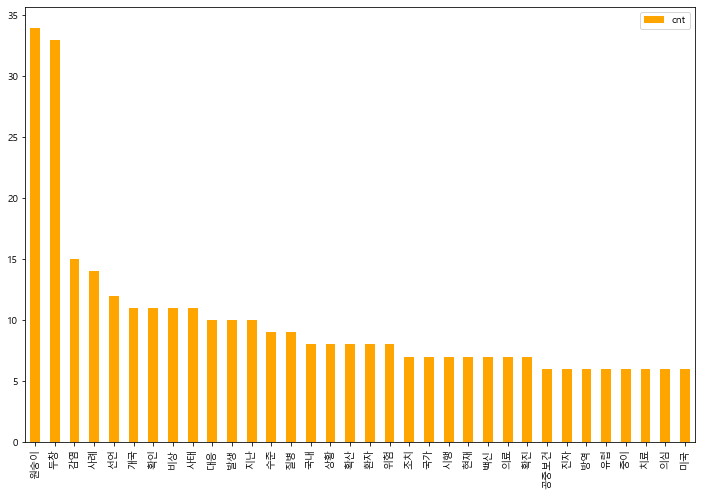

In [138]:
df[df['cnt']>5].plot(kind='bar', color='orange', figsize=(12,8))

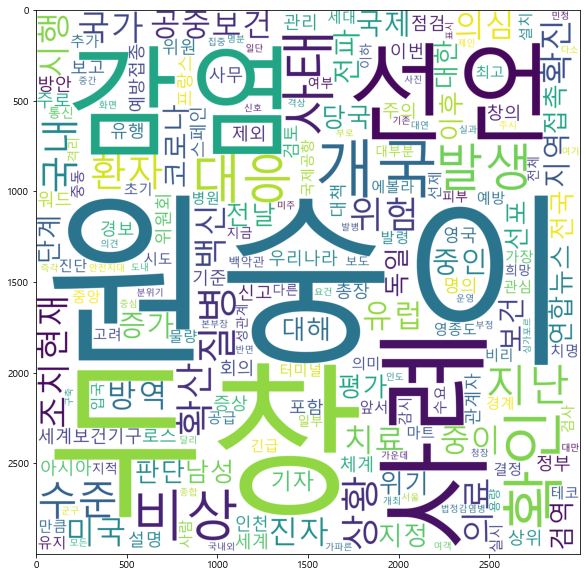

In [147]:
#워드 클라우드 만들기
from wordcloud import WordCloud

wordcloud=WordCloud(font_path='../visualization/dataset/malgun.ttf',
                                          width=3000,
                                          height=3000,
                                          background_color='white').generate_from_frequencies(data)
plt.figure(figsize=(10,10))
plt.imshow(wordcloud)


In [ ]:
from konlpy.tag import Hannanum
from konlpy.tag import 

